# SPPA-T3000 Output Data Processing Tool

<strong>This Jupyter Notebook serves as a tool for processing the output data files as given by the Siemens SPPA-T3000 system. This notebook intends to facilitate the handling of the DCS data from this types of systems that are characterised for returning an unstructured data frame that results in an excessive time destined to raw data preparation prior to its utilisation in the calculation stage.</strong>

# 1. Installing required libraries

In [50]:
!pip install numpy
!pip install pandas
!pip install matplotlib
!pip install scipy

Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.
Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.
Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.
Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


In [51]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.optimize as opt

# 2. Importing the data file

<strong>Input the name and path of the file where your dataset is stored. The dataset file should be in .dat or .txt format for the notebook to be able to properly process it.</strong>

In [52]:
file_name = 'PTU10CCSEC1'

In [53]:
file_path = r'C:\Users\Nestor Ortega\Desktop\T3000 Output Data'

In [54]:
df = pd.read_csv(str(file_name)+'.txt', encoding="ISO-8859-1", header = None)

# 3. Visualize your data

<strong>Visualize your data. For large dataframes is advisable to only display the first rows to avoid the allocation and utilisation of memory that causes the notebook to perform slower.

If you still want to visualise the entire dataframe replace the last line of the following cell with 'df' (i.e. df.head() -> df).</strong>

In [55]:
pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_columns',20)
pd.set_option('display.max_rows',9000)
df.rename(columns={list(df)[0]:'Raw'}, inplace=True)
df

,Raw
0,Analog value sequence log San Pedro de Macoris page 1
1,Sequence of 2020-07-09 11:26:00 to 2020-07-09 13:26:00 from 137
2,Output on 2020-07-10 13:06:57
3,User: All Units
4,Log name: PTU10CCSEC1 Analog value sequ
5,Text:
6,---------- selection criteria ----------
7,GROUP PERFORMANCE TEST 10 2-LF
8,1: 10HHF20CF001 XQ01 H1 DUCT BURN FUEL OIL FLOW kg/s
9,2: 10HHF20CG101 XQ01 H1 DB FUEL OIL CTRL-V POSN %


<strong>Showing some data stats</strong>

In [56]:
df.describe()

,Raw
count,8174
unique,7403
top,DUCT BURN DB FUEL O CLN DRN T TEMP COMP TEMP TURB
freq,137


# 4. Preparing and cleaning the dataframe

<strong>Creating new columns with the name of the variables found the dataframe. This step is done manually since the output file of the T3000 systems will always contain a different number and type of variable.</strong>

In [57]:
df[str(df.loc[8,'Raw'])] = np.nan
df[str(df.loc[9,'Raw'])] = np.nan
df[str(df.loc[10,'Raw'])] = np.nan
df[str(df.loc[11,'Raw'])] = np.nan
df[str(df.loc[12,'Raw'])] = np.nan


<strong>Dropping all the rows that contain strings. For this step just add a new line with the same format as the commands below and add the first word of the string of the row you want to drop.

Example:
df = df[~df.Raw.str.contains("your word goes here")]

"Raw" in the command above is for the name of the column, if the string is in a column with a different header you can change it manually.

</strong>

In [58]:
df = df[~df.Raw.str.contains("Analog value")]
df = df[~df.Raw.str.contains("Sequence of")]
df = df[~df.Raw.str.contains("Output on")]
df = df[~df.Raw.str.contains("User:")]
df = df[~df.Raw.str.contains("Log name:")]
df = df[~df.Raw.str.contains("Text:")]
df = df[~df.Raw.str.contains("selection criteria")]
df = df[~df.Raw.str.contains("GROUP")]
df = df[~df.Raw.str.contains("1: 10HHF20CF001")]
df = df[~df.Raw.str.contains("2: 10HHF20CG101")]
df = df[~df.Raw.str.contains("3: 10LCM10CL001")]
df = df[~df.Raw.str.contains("4: 10MBA11CT901")]
df = df[~df.Raw.str.contains("5: 10MBA26CT900")]
df = df[~df.Raw.str.contains("DUCT BURN")]
df = df[~df.Raw.str.contains("FUEL OIL")]
df = df[~df.Raw.str.contains("----------")]
df = df[~df.Raw.str.contains("kg/s")]
df = df[~df.Raw.str.contains("minimum")]
df = df[~df.Raw.str.contains("maximum")]
df = df[~df.Raw.str.contains("Average")]
df = df[~df.Raw.str.contains("End of log")]

In [59]:
df.head()


,Raw,1: 10HHF20CF001 XQ01 H1 DUCT BURN FUEL OIL FLOW kg/s,2: 10HHF20CG101 XQ01 H1 DB FUEL OIL CTRL-V POSN %,3: 10LCM10CL001 XQ01 W1 CLN DRN TNK LEVEL mm,4: 10MBA11CT901 ZQ01 G1 TEMP COMPR INLET °C,5: 10MBA26CT900 ZQ21 G1 TEMP TURB OUTLET °C
17,11:26:00 0.360 53.510 63.540 31.290 605.240,NaN,NaN,NaN,NaN,NaN
18,11:26:01 0.360 53.510 63.540 31.290 605.240,NaN,NaN,NaN,NaN,NaN
19,11:26:02 0.360 53.510 63.540 31.290 605.240,NaN,NaN,NaN,NaN,NaN
20,11:26:03 0.360 53.510 63.540 31.290 605.240,NaN,NaN,NaN,NaN,NaN
21,11:26:04 0.360 53.510 63.540 31.290 605.240,NaN,NaN,NaN,NaN,NaN


<strong>Create a list of strings for the headers specified.</strong>

In [60]:
header = list(df.columns) 
print(header)

['Raw', ' 1: 10HHF20CF001         XQ01  H1  DUCT BURN FUEL OIL FLOW                        kg/s', ' 2: 10HHF20CG101         XQ01  H1  DB FUEL OIL CTRL-V POSN                        %', ' 3: 10LCM10CL001         XQ01  W1  CLN DRN TNK LEVEL                              mm', ' 4: 10MBA11CT901         ZQ01  G1  TEMP COMPR INLET                               °C', ' 5: 10MBA26CT900         ZQ21  G1  TEMP TURB OUTLET                               °C']


<strong>Split the Raw column to extract the value of the variables in the string. This command will separate the Raw column based on blank spaces present in the string. It will subsequently create new columns for the splitted parts of the string.</strong>

In [61]:
df = df.Raw.str.split(expand=True)

<strong>Replace the newly created dataframe headers with the headers stored in the previous step.</strong>

In [62]:
df.columns = header

<strong>Saving Time column as a Series.</strong>

In [63]:
df = df.rename(columns={'Raw': 'Time'})
ps = df['Time']
df.set_index('Time')

,1: 10HHF20CF001 XQ01 H1 DUCT BURN FUEL OIL FLOW kg/s,2: 10HHF20CG101 XQ01 H1 DB FUEL OIL CTRL-V POSN %,3: 10LCM10CL001 XQ01 W1 CLN DRN TNK LEVEL mm,4: 10MBA11CT901 ZQ01 G1 TEMP COMPR INLET °C,5: 10MBA26CT900 ZQ21 G1 TEMP TURB OUTLET °C
Time,,,,,
11:26:00,0.360,53.510,63.540,31.290,605.240
11:26:01,0.360,53.510,63.540,31.290,605.240
11:26:02,0.360,53.510,63.540,31.290,605.240
11:26:03,0.360,53.510,63.540,31.290,605.240
11:26:04,0.360,53.510,63.540,31.290,605.240
11:26:05,0.360,53.510,63.540,31.290,605.240
11:26:06,0.360,53.510,63.540,31.290,605.240
11:26:07,0.360,53.510,63.540,31.290,605.240
11:26:08,0.360,53.510,63.540,31.290,605.240


<strong>Converting applicable columns from string to float.</strong>

In [64]:
df = df.iloc[: , [1, 2, 3, 4, 5]].apply(pd.to_numeric)

In [65]:
df.head()

,1: 10HHF20CF001 XQ01 H1 DUCT BURN FUEL OIL FLOW kg/s,2: 10HHF20CG101 XQ01 H1 DB FUEL OIL CTRL-V POSN %,3: 10LCM10CL001 XQ01 W1 CLN DRN TNK LEVEL mm,4: 10MBA11CT901 ZQ01 G1 TEMP COMPR INLET °C,5: 10MBA26CT900 ZQ21 G1 TEMP TURB OUTLET °C
17,0.36,53.51,63.54,31.29,605.24
18,0.36,53.51,63.54,31.29,605.24
19,0.36,53.51,63.54,31.29,605.24
20,0.36,53.51,63.54,31.29,605.24
21,0.36,53.51,63.54,31.29,605.24


<strong>Inserting previously saved time series in the dataframe and converting it to index.</strong>

In [66]:
df.insert(0, 'Time', ps)

In [67]:
df.set_index('Time')

,1: 10HHF20CF001 XQ01 H1 DUCT BURN FUEL OIL FLOW kg/s,2: 10HHF20CG101 XQ01 H1 DB FUEL OIL CTRL-V POSN %,3: 10LCM10CL001 XQ01 W1 CLN DRN TNK LEVEL mm,4: 10MBA11CT901 ZQ01 G1 TEMP COMPR INLET °C,5: 10MBA26CT900 ZQ21 G1 TEMP TURB OUTLET °C
Time,,,,,
11:26:00,0.36,53.51,63.54,31.290,605.240
11:26:01,0.36,53.51,63.54,31.290,605.240
11:26:02,0.36,53.51,63.54,31.290,605.240
11:26:03,0.36,53.51,63.54,31.290,605.240
11:26:04,0.36,53.51,63.54,31.290,605.240
11:26:05,0.36,53.51,63.54,31.290,605.240
11:26:06,0.36,53.51,63.54,31.290,605.240
11:26:07,0.36,53.51,63.54,31.290,605.240
11:26:08,0.36,53.51,63.54,31.290,605.240


In [68]:
df.describe()

,1: 10HHF20CF001 XQ01 H1 DUCT BURN FUEL OIL FLOW kg/s,2: 10HHF20CG101 XQ01 H1 DB FUEL OIL CTRL-V POSN %,3: 10LCM10CL001 XQ01 W1 CLN DRN TNK LEVEL mm,4: 10MBA11CT901 ZQ01 G1 TEMP COMPR INLET °C,5: 10MBA26CT900 ZQ21 G1 TEMP TURB OUTLET °C
count,7.201000e+03,7201.00,7201.000000,7201.000000,7201.000000
mean,3.600000e-01,53.51,64.813848,31.777101,605.492704
std,5.551501e-17,0.00,0.582144,0.374920,0.486677
min,3.600000e-01,53.51,63.540000,31.200000,604.498000
25%,3.600000e-01,53.51,64.260000,31.410000,605.025000
50%,3.600000e-01,53.51,64.800000,31.965000,605.304000
75%,3.600000e-01,53.51,65.340000,31.980000,605.985000
max,3.600000e-01,53.51,65.340000,32.760000,606.173000


# 5. Exporting the cleaned dataframe

<strong>Writing the treated dataframe to output file.</strong>

In [72]:
!pip install xlsxwriter

Please see https://github.com/pypa/pip/issues/5599 for advice on fixing the underlying issue.
To avoid this problem you can invoke Python with '-m pip' instead of running pip directly.


In [73]:
df.to_excel(str(file_name)+'.xlsx', engine='xlsxwriter')

<AxesSubplot:ylabel='Frequency'>

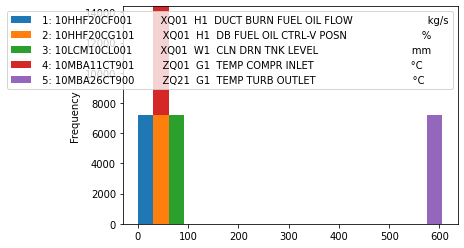

In [70]:
df.plot.hist(stacked=True, bins=20)